In [1]:
from scipy.spatial import Voronoi, voronoi_plot_2d, Delaunay, delaunay_plot_2d

import numpy as np
import csv
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 360

from astropy.io import fits
from astropy.cosmology import WMAP9 as cosmo
from astropy.coordinates import SkyCoord
import astropy.units as u
import h5py
import time as t
from sklearn import preprocessing

In [2]:
rosettes = [3,6,7,11,12,13,14,15,18,19]

### Write graph

In [3]:
def read_data_vd(r):
    hdu = fits.open('./data_vd/BGS_ANY_N_clustering.dat.fits')
    data_bgs = hdu[1].data
    data_prova = h5py.File('./data_vd/BGS_ANY_full.provabgs.sv3.v0.hdf5')
    dataset = data_prova['__astropy_table__']

    rosette_n = data_bgs[data_bgs['ROSETTE_NUMBER'] == r]
    ids = rosette_n['TARGETID']

    #filter by mass availability
    selected = [(row[0], row[15]) for row in dataset if row[0] in ids]

    #filter nodes data: [RA,DEC,d]
    mass = selected
    nodes = []

    for j in range(len(mass)):
        data_j = data_bgs[data_bgs['TARGETID'] == mass[j][0]]
        flux_w1 = data_j['FLUX_W1_DERED'][0]
        flux_w2 = data_j['FLUX_W2_DERED'][0]
        z = data_j['Z'][0]
        if (mass[j][1]>=0) and (flux_w1>=0) and (flux_w2>=0):
            RA = data_j['RA'][0]
            DEC = data_j['DEC'][0]
            d_n = cosmo.comoving_distance(data_j['Z'])
            nodes.append([RA, DEC, z])

    return nodes

In [4]:
def write_data(r, nodes):
    with open(f'./data_vd/rosette{r}_nodes.csv', mode='w', newline='') as csv_file:
        fieldnames = ['RA','DEC','Z']
        writer = csv.DictWriter(csv_file, fieldnames=fieldnames)
        writer.writeheader()
        for ra,dec,z in nodes:
            writer.writerow({
                'RA':ra,
                'DEC':dec,
                'Z':z
            })

In [41]:
for r in [3]:#rosettes:
    init = t.time()
    nodes = read_data_vd(r)
    write_data(r,nodes)
    end = t.time()
    print(f'time writing rosette_{r} csv: {round((end-init)/60,2)} m, {len(nodes)} nodes')

time writing rosette_3 csv: 11.7 m, 11157 nodes


### Graph dv
nodes = [RA, DEC, d]

In [5]:
def graph_dv(r):

    nodes = []
    with open(f'./data_vd/rosette{r}_nodes.csv', mode='r') as csv_file:
        csv_reader = csv.DictReader(csv_file)
        for row in csv_reader:
            if (row!=0):
                nodes.append([float(n) for n in list(row.values())])
    return nodes

In [6]:
nodes = np.array(graph_dv(rosettes[0]))

### Voronoi diagram

Voronoi 2d (RA,DEC)

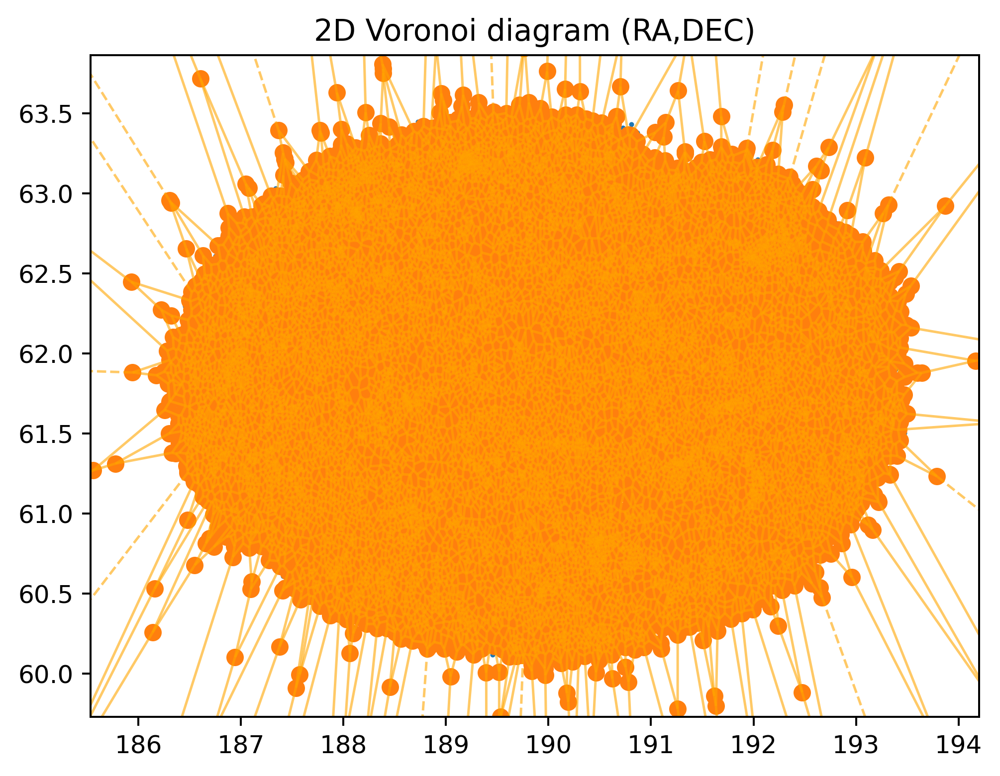

In [44]:
vor_2d = Voronoi(nodes[:,:2])
fig = voronoi_plot_2d(vor_2d, show_vertices=True, line_colors='orange',
                      lizne_width=2, line_alpha=0.6, point_size=2)
plt.title('2D Voronoi diagram (RA,DEC)')
plt.show()

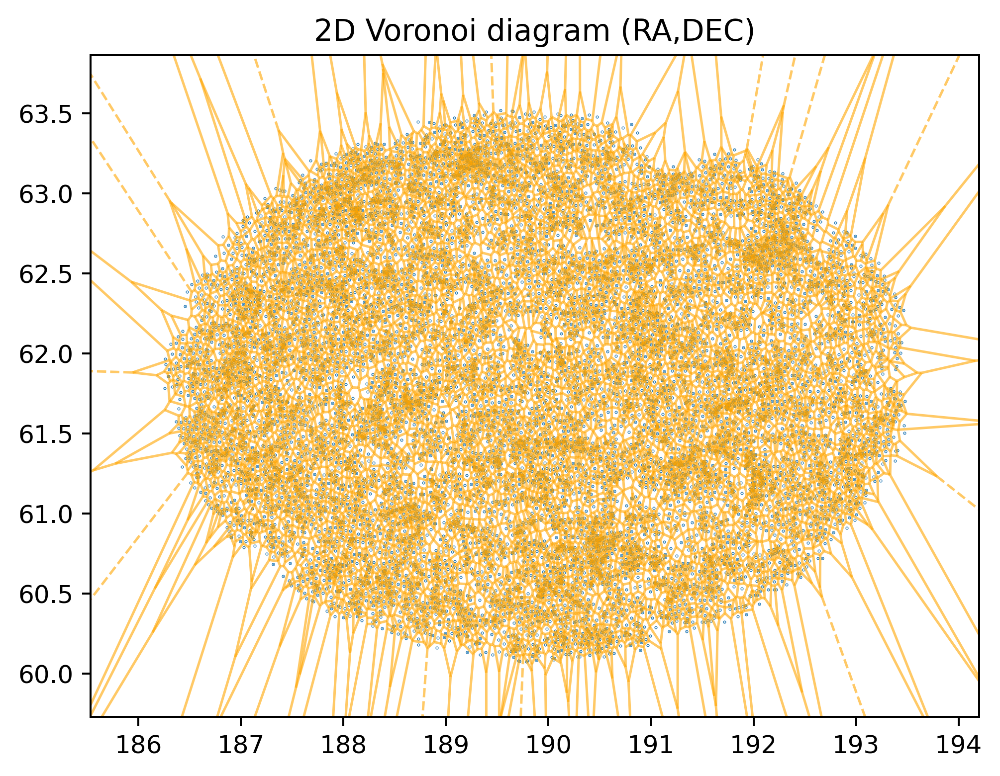

In [45]:
fig = voronoi_plot_2d(vor_2d, show_vertices=False, line_colors='orange',
                      lizne_width=2, line_alpha=0.6, point_size=0.5)
plt.title('2D Voronoi diagram (RA,DEC)')
plt.show()

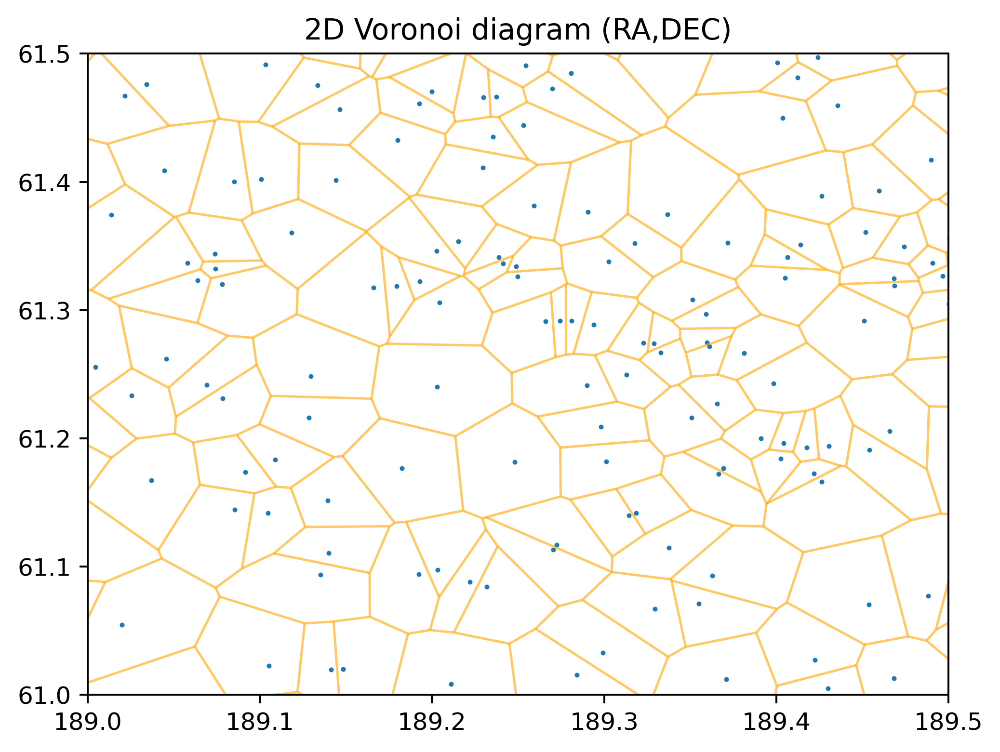

In [7]:
fig = voronoi_plot_2d(vor_2d, show_vertices=False, line_colors='orange',
                      lizne_width=2, line_alpha=0.6, point_size=2)
plt.title('2D Voronoi diagram (RA,DEC)')
plt.xlim([189,189.5])
plt.ylim([61,61.5])
plt.show()

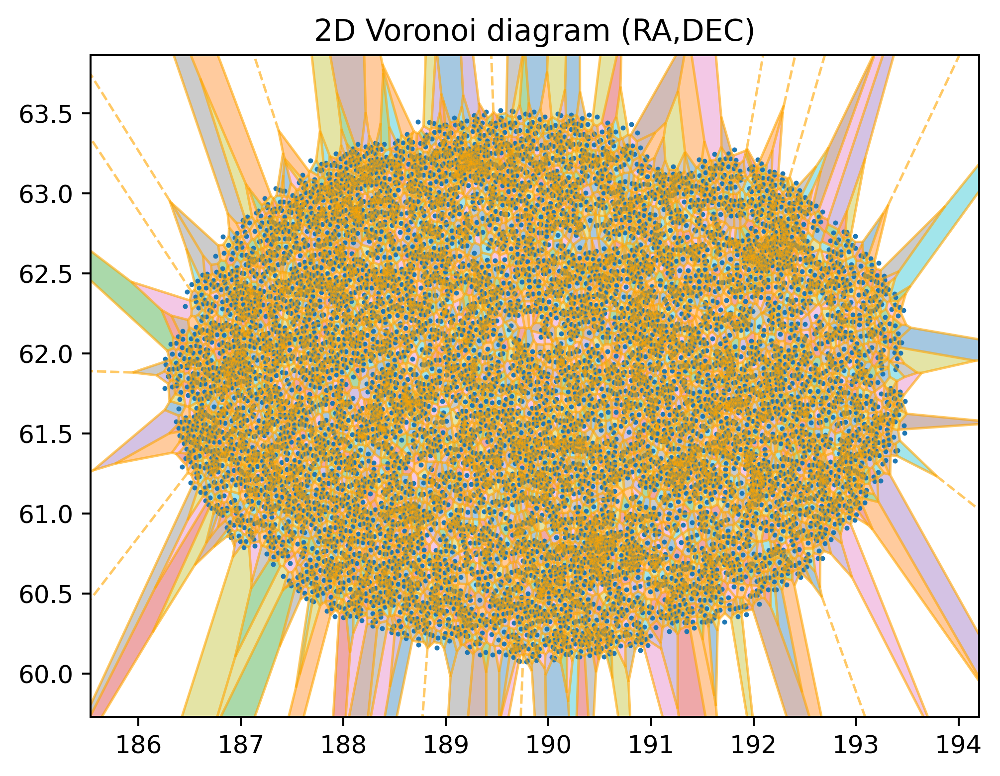

In [46]:
vor_2d = Voronoi(nodes[:,:2])
fig = voronoi_plot_2d(vor_2d, show_vertices=False, line_colors='orange', lizne_width=2, line_alpha=0.6, point_size=2)

for region in vor_2d.regions:
    if not -1 in region:# and len(region) > 0:
        polygon = [vor_2d.vertices[i] for i in region]
        plt.fill(*zip(*polygon), alpha=0.4)
plt.title('2D Voronoi diagram (RA,DEC)')
plt.show()

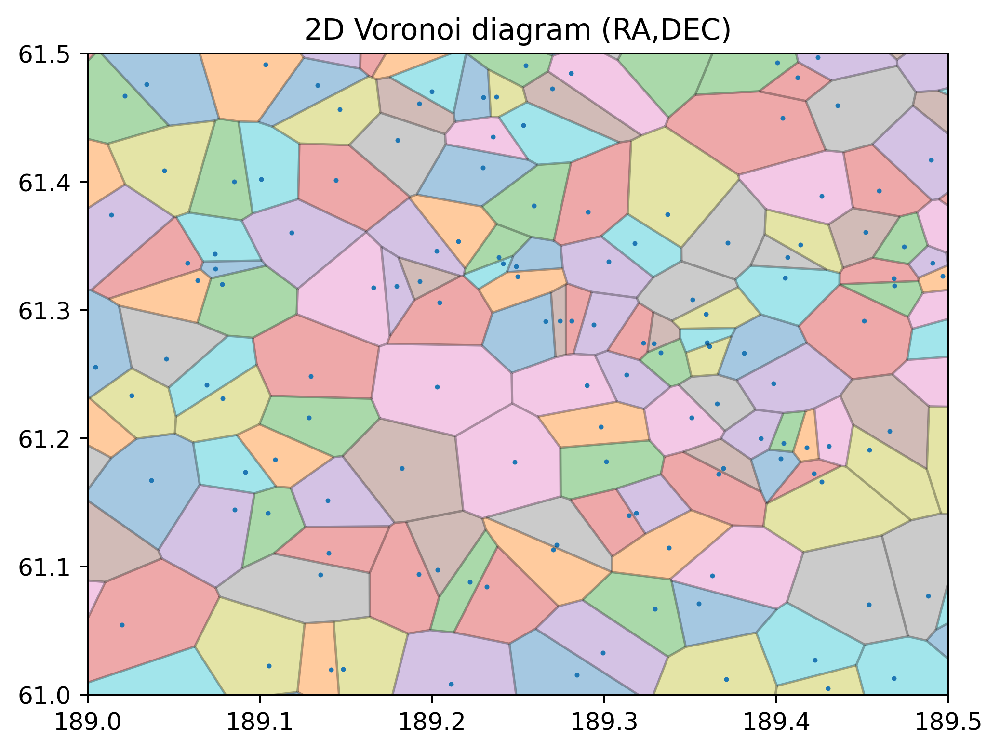

In [47]:
fig = voronoi_plot_2d(vor_2d, show_vertices=False, line_colors='black', lizne_width=2, line_alpha=0.3, point_size=2)

for region in vor_2d.regions:
    if not -1 in region and len(region) > 0:
        polygon = [vor_2d.vertices[i] for i in region]
        plt.fill(*zip(*polygon), alpha=0.4)

plt.title('2D Voronoi diagram (RA,DEC)')
plt.xlim([189,189.5])
plt.ylim([61,61.5])
plt.show()

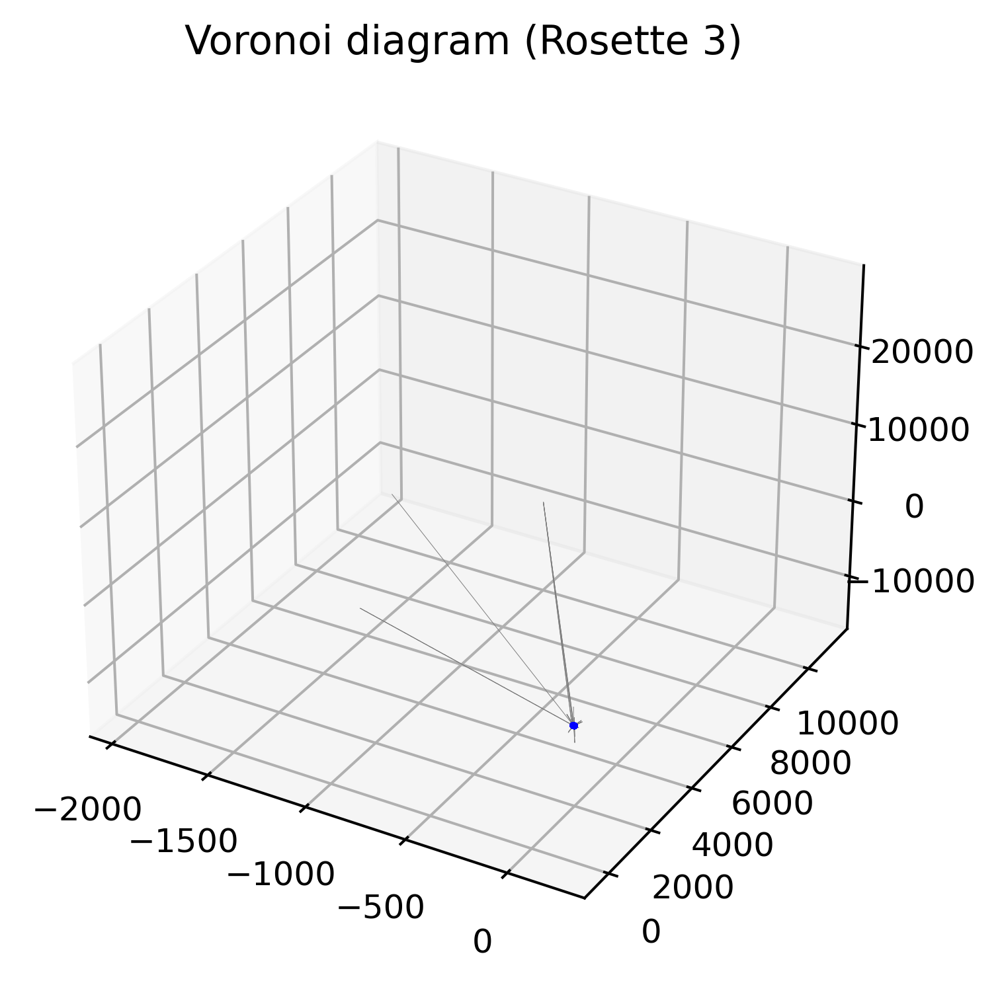

In [178]:
vor = Voronoi(nodes)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(nodes[:,0], nodes[:,1], nodes[:,2], s=1, color='blue')

for simplex in vor.ridge_vertices:
    simplex = np.asarray(simplex)
    if np.all(simplex >= 0):
        #ax.scatter(vor.vertices[simplex, 0], vor.vertices[simplex, 1], vor.vertices[simplex, 2], color='red', s=0.2)
        ax.plot(vor.vertices[simplex, 0], vor.vertices[simplex, 1], vor.vertices[simplex, 2], color='grey', linewidth=0.2)

ax.set_title('Voronoi diagram (Rosette 3)')
plt.show()

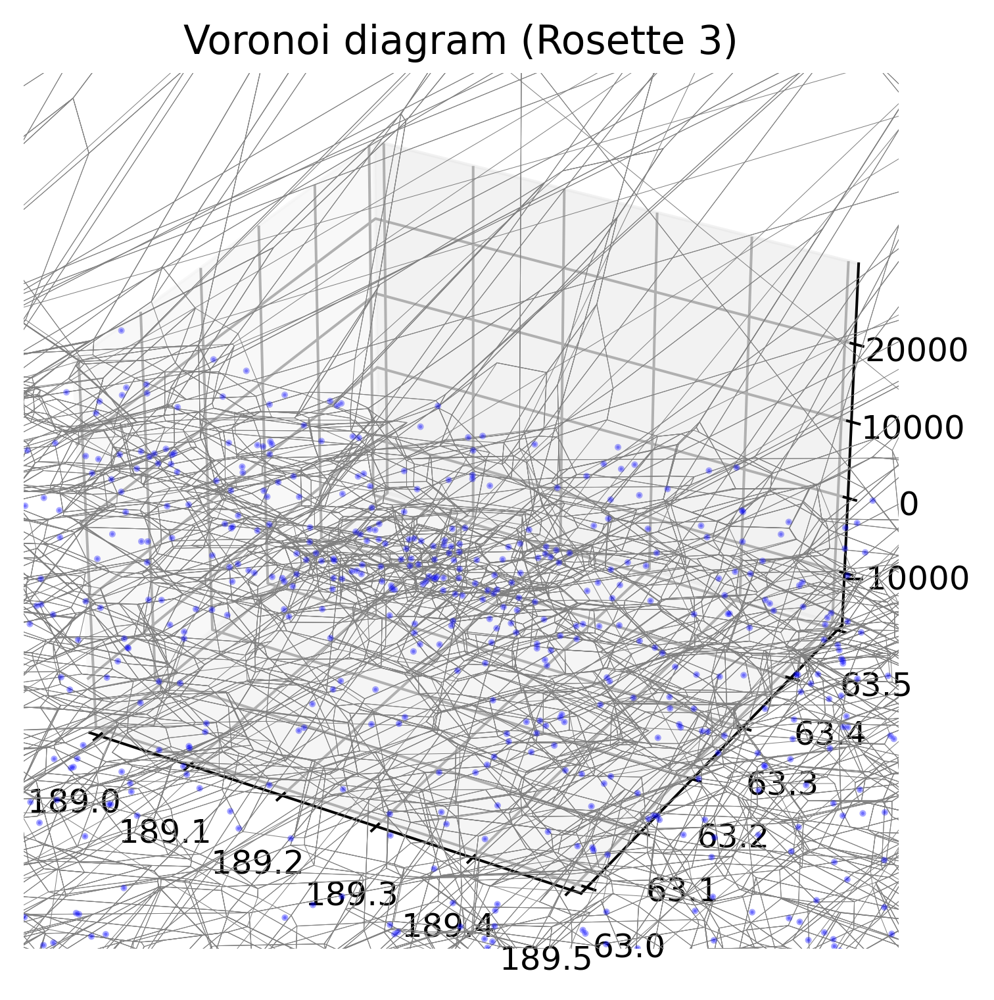

In [184]:
vor = Voronoi(nodes)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(nodes[:,0], nodes[:,1], nodes[:,2], s=1.2, color='blue')

for simplex in vor.ridge_vertices:
    simplex = np.asarray(simplex)
    if np.all(simplex >= 0):
        ax.scatter(vor.vertices[simplex, 0], vor.vertices[simplex, 1], vor.vertices[simplex, 2], color='red', s=0.2)
        ax.plot(vor.vertices[simplex, 0], vor.vertices[simplex, 1], vor.vertices[simplex, 2], color='black', linewidth=0.2)

plt.xlim([189,189.5])
plt.ylim([63,63.5])

ax.set_title('Voronoi diagram (Rosette 3)')
plt.show()

### Delaunay triangulations

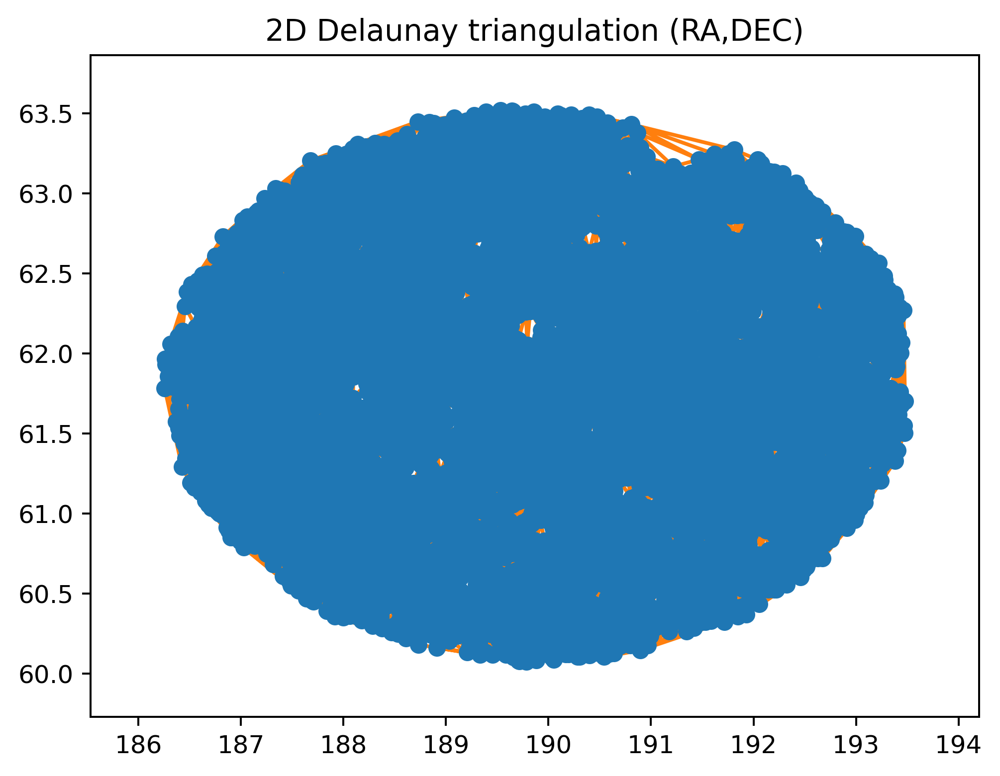

In [11]:
triangulation = Delaunay(nodes[:,:2])

_ = delaunay_plot_2d(triangulation)
plt.title('2D Delaunay triangulation (RA,DEC)')
plt.show()

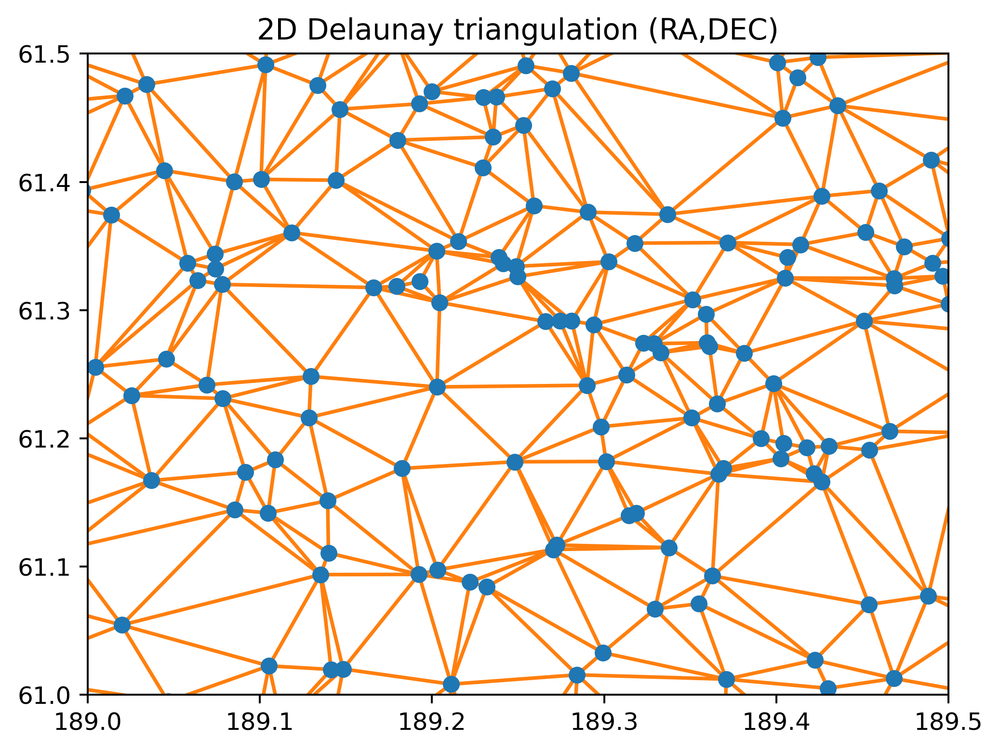

In [12]:
triangulation = Delaunay(nodes[:,:2])

_ = delaunay_plot_2d(triangulation)
plt.title('2D Delaunay triangulation (RA,DEC)')
plt.xlim([189,189.5])
plt.ylim([61,61.5])
plt.show()

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
t_3d = Delaunay(nodes)

ax.scatter(points[:, 0], points[:, 1], points[:, 2], c='b', marker='o', s=50)
for simplex in triangulation.simplices:
    simplex = np.asarray(simplex)
    ax.plot(points[simplex, 0], points[simplex, 1], points[simplex, 2], 'k-')

### Voronoi-Delaunay

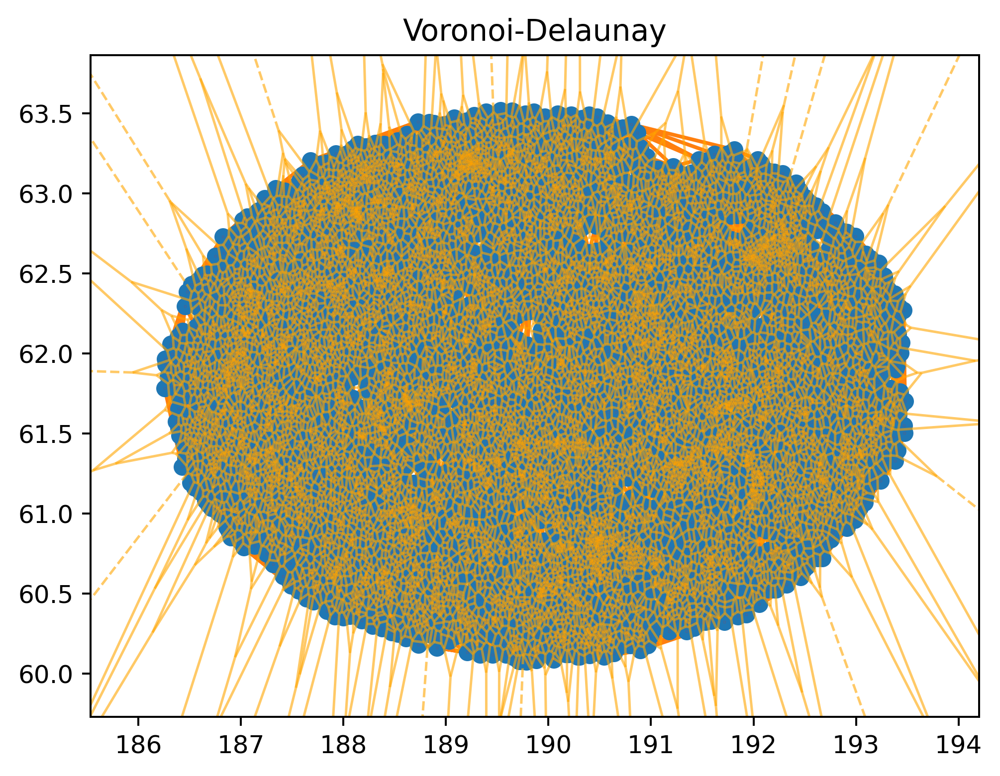

In [13]:
fig = plt.figure()
ax = fig.add_subplot(111)

triangulation = Delaunay(nodes[:,:2])
delaunay_plot_2d(triangulation, ax)
voronoi_plot_2d(vor_2d, show_vertices=False, line_colors='orange', lizne_width=2, line_alpha=0.6, point_size=0.1, ax=ax)
plt.title('Voronoi-Delaunay')
plt.show()

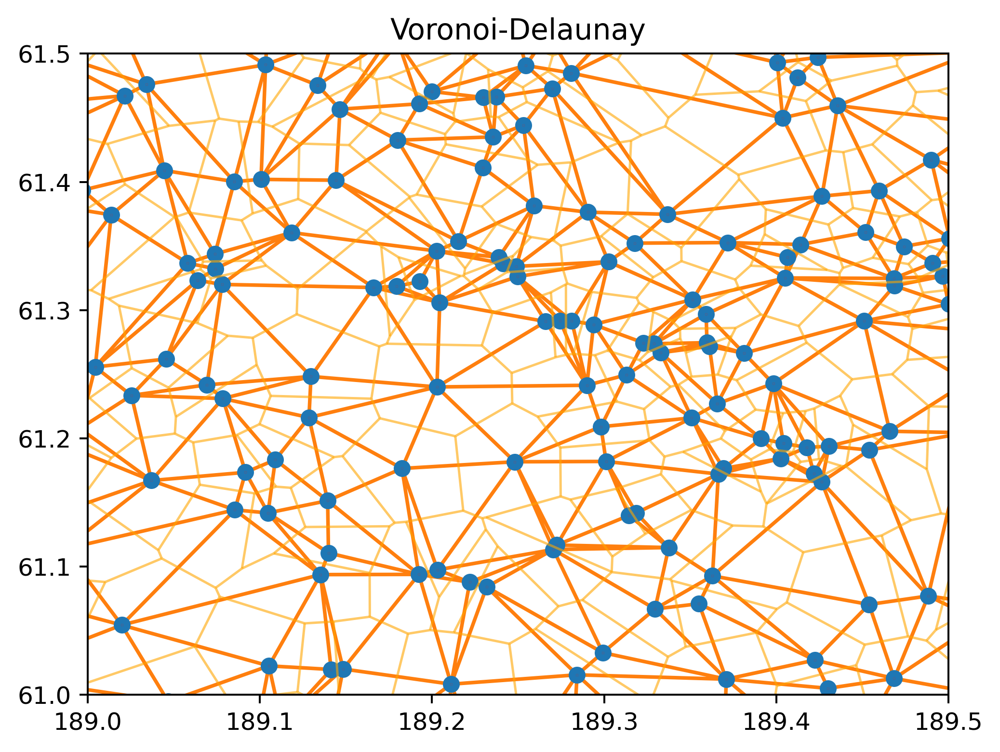

In [14]:
fig = plt.figure()
ax = fig.add_subplot(111)

triangulation = Delaunay(nodes[:,:2])
delaunay_plot_2d(triangulation, ax)
voronoi_plot_2d(vor_2d, show_vertices=False, line_colors='orange', lizne_width=2, line_alpha=0.6, point_size=0.1, ax=ax)
plt.xlim([189,189.5])
plt.ylim([61,61.5])
plt.title('Voronoi-Delaunay')
plt.show()